# Kmer Model Generation

In [1]:
from datetime import date
from pycltools.pycltools import jprint

jprint('Adrien Leger / EMBL EBI', bold=True, size=150)
jprint('Starting date : 2018_11_19', bold=True, italic=True, size=125)
jprint('Last modification date : {}_{:02}_{:02}'.format(date.today().year, date.today().month, date.today().day), bold=True, italic=True, size=125)

## Import

In [1]:
# Standard lib packages
import os
from datetime import date
from collections import Counter, namedtuple, defaultdict
from glob import glob
from shutil import rmtree
import itertools
from pprint import pprint 
import pickle
import shelve
import warnings
from time import time

# Third party packages
from pycltools.pycltools import *
import matplotlib.pyplot as pl
import seaborn as sns
import pandas as pd
import pysam
import numpy as np
import pyfaidx
from tqdm import tqdm
import scipy as sp
import scipy.stats as st
from scipy.ndimage import gaussian_filter1d
import statsmodels as sm

# Matplotlib and pandas setup
%matplotlib inline
pl.rcParams.update({'figure.max_open_warning': 0})
pd.options.display.max_colwidth = 200
pd.options.display.max_columns = 200

# Align and resquiggle IVT dataset

## Download reference files

In [39]:
d = "References"
rmtree (d, ignore_errors=True)
mkdir (d)

Creating /nfs/leia/research/enright/nanopore/analyses/nanocompore_artificial_data_generator/References


In [42]:
fp = wget ("ftp://ftp.ebi.ac.uk/pub/databases/gencode/Gencode_human/release_28/gencode.v28.transcripts.fa.gz", "./References/gencode_v28_transcripts.fa.gz")

_ = gunzip_file ("./References/gencode_v28_transcripts.fa.gz")

print ("Cleaning Ids")
with open ("./References/gencode_v28_transcripts_clean.fa", "w") as fasta_out, pyfaidx.Fasta("./References/gencode_v28_transcripts.fa") as fasta_in:
    for s in fasta_in:
        split_name = s.name.split("|")
        fasta_out.write (">{}|{}\n{}\n".format(split_name[0], split_name[5], str(s)))

print ("Index fasta files")
_ = pysam.faidx("./References/gencode_v28_transcripts.fa")
_ = pysam.faidx("./References/gencode_v28_transcripts_clean.fa")

Downloading: ftp://ftp.ebi.ac.uk/pub/databases/gencode/Gencode_human/release_28/gencode.v28.transcripts.fa.gz	Bytes: 64672964
64.7 MB Downloaded	[100 %]
Uncompressing ./References/gencode_v28_transcripts.fa.gz
Cleaning Ids
Index fasta files


## Minimap2_2.14

In [47]:
d = "Minimap2_2.14"
rmtree (d, ignore_errors=True)
mkdir (d)

Creating /nfs/leia/research/enright/nanopore/analyses/nanocompore_artificial_data_generator/Minimap2_2.14


In [48]:
# Shared options
virtualenv = "Minimap2_2.14"
dry = False
fasta = "./References/gencode_v28_transcripts_clean.fa"
fastq = "/nfs/leia/research/enright/nanopore/datasets/RNA_IVT_UCSC/01_29_18_R94_12878IVT.fastq"
bam = "./Minimap2_2.14/IVT.bam"

cmd = f"minimap2 -ax map-ont -L -t 20 {fasta} {fastq} | samtools view -bh -F 2324 -q 30 | samtools sort -O bam > {bam}"
jobid1 = bsub (virtualenv=virtualenv, cmd=cmd, mem=30000, threads=20, dry=dry)

cmd=f"samtools index {bam}"
jobid2 = bsub (virtualenv=virtualenv, cmd=cmd, wait_jobid=jobid1, dry=dry)

bsub -M 30000 -R 'rusage[mem=30000]' -n 20  "minimap2 -ax map-ont -L -t 20 ./References/gencode_v28_transcripts_clean.fa /nfs/leia/research/enright/nanopore/datasets/RNA_IVT_UCSC/01_29_18_R94_12878IVT.fastq | samtools view -bh -F 2324 -q 30 | samtools sort -O bam > ./Minimap2_2.14/IVT.bam"
Job <210539> is submitted to default queue <standard>.
bsub -w 'post_done(210539)'  "samtools index ./Minimap2_2.14/IVT.bam"
Job <210540> is submitted to default queue <standard>.


## Nanopolish_0.10.1

In [52]:
d = "Nanopolish_0.10.1"
rmtree (d, ignore_errors=True)
mkdir (d)

Creating /nfs/leia/research/enright/nanopore/analyses/nanocompore_artificial_data_generator/Nanopolish_0.10.1


In [57]:
dry = False
virtualenv = "Nanopolish_0.10.1"
ref = "./References/gencode_v28_transcripts_clean.fa"
fastq_original = "/nfs/leia/research/enright/nanopore/datasets/RNA_IVT_UCSC/01_29_18_R94_12878IVT.fastq"
fastq = "./Nanopolish_0.10.1/IVT.fastq"
fast5dir = "/nfs/leia/research/enright/nanopore/datasets/RNA_IVT_UCSC/UCSC_Run1_20180129_IVT_RNA/"
bam = "./Minimap2_2.14/IVT.bam"
index_stderr_fp = "./Nanopolish_0.10.1/nanopolish_index_stderr.txt"
event_align_stderr_fp = "./Nanopolish_0.10.1/nanopolish_eventalign_stderr.txt"
event_align_outfn = "./Nanopolish_0.10.1/eventalign_out.tsv"
event_align_collapsed_outfn = "./Nanopolish_0.10.1/eventalign_out_collapsed.tsv"

jprint("Link fastq", bold=True)
cmd = f"ln {fastq_original} {fastq}"
jobid1 = bsub (cmd=cmd, mem=5000, dry=dry)

jprint("Index reads", bold=True)
cmd = f"nanopolish index -d {fast5dir} {fastq}"
jobid2 = bsub (virtualenv=virtualenv, cmd=cmd, stderr_fp=index_stderr_fp, mem=5000, send_email=True, wait_jobid=jobid1, dry=dry)

jprint("Resquiggle", bold=True)
cmd = f"nanopolish eventalign -t 20 --reads {fastq} --bam {bam} --genome {ref} --print-read-names --signal-index --samples --scale-events > {event_align_outfn}"
jobid3 = bsub (virtualenv=virtualenv, cmd=cmd, stderr_fp=event_align_stderr_fp, threads=20, mem=10000, send_email=True, wait_jobid=jobid2, dry=dry)

jprint("Collapse results", bold=True)
cmd = f"NanopolishComp Eventalign_collapse -t 20 -i {event_align_outfn} -o {event_align_collapsed_outfn}"
jobid4 = bsub (virtualenv=virtualenv, cmd=cmd, threads=15, mem=10000, send_email=True, wait_jobid=jobid3, dry=dry)

bsub -M 5000 -R 'rusage[mem=5000]'  "ln /nfs/leia/research/enright/nanopore/datasets/RNA_IVT_UCSC/01_29_18_R94_12878IVT.fastq ./Nanopolish_0.10.1/IVT.fastq"
Job <212057> is submitted to default queue <standard>.


bsub -M 5000 -R 'rusage[mem=5000]' -eo ./Nanopolish_0.10.1/nanopolish_index_stderr.txt -N -w 'post_done(212057)'  "nanopolish index -d /nfs/leia/research/enright/nanopore/datasets/RNA_IVT_UCSC/UCSC_Run1_20180129_IVT_RNA/ ./Nanopolish_0.10.1/IVT.fastq"
Job <212058> is submitted to default queue <standard>.


bsub -M 10000 -R 'rusage[mem=10000]' -n 20 -eo ./Nanopolish_0.10.1/nanopolish_eventalign_stderr.txt -N -w 'post_done(212058)'  "nanopolish eventalign -t 20 --reads ./Nanopolish_0.10.1/IVT.fastq --bam ./Minimap2_2.14/IVT.bam --genome ./References/gencode_v28_transcripts_clean.fa --print-read-names --signal-index --samples --scale-events > ./Nanopolish_0.10.1/eventalign_out.tsv"
Job <212060> is submitted to default queue <standard>.


bsub -M 10000 -R 'rusage[mem=10000]' -n 15 -N -w 'post_done(212060)'  "NanopolishComp Eventalign_collapse --write_samples -t 15 -i ./Nanopolish_0.10.1/eventalign_out.tsv -o ./Nanopolish_0.10.1/eventalign_out_collapsed.tsv"
Job <212061> is submitted to default queue <standard>.


In [199]:
display (pd.read_csv("./Nanopolish_0.10.1/eventalign_out_collapsed.tsv.idx", comment="#", nrows=10, sep="\t"))
display (pd.read_csv("./Nanopolish_0.10.1/eventalign_out_collapsed.tsv", comment="#", nrows=10, sep="\t"))

,ref_id,ref_start,ref_end,read_id,dwell_time,kmers,NNNNN_kmers,mismatch_kmers,missing_kmers,byte_offset,byte_len
0,ENST00000445118.6|RP11-206L10.11,645,1111,3d85586a-66f3-4338-ba15-b01204b704fc,6.18474,439,16,0,35,0,35934
1,ENST00000379389.4|ISG15,59,563,cc824dce-3d84-46d3-84ab-4390e4e0aeab,8.32146,481,15,0,23,35935,39206
2,ENST00000447500.4|RP11-206L10.8,339,868,629ab4d2-888b-4a91-8bdd-a37410a95f50,7.34941,502,18,0,27,75142,40873
3,ENST00000469563.1|NOC2L,0,802,0e4e6e94-9015-40db-9125-701aad046deb,12.73855,768,19,0,35,116016,62603
4,ENST00000506640.2|RP11-206L10.2,5878,6387,1a2fc6bb-6c34-40d7-9f0a-8d30356e2b5a,9.71254,469,18,0,40,178620,38557
5,ENST00000304952.10|HES4,18,895,02a58a45-907f-408f-bbcc-73493091c002,12.54398,850,24,0,28,217178,69128
6,ENST00000506640.2|RP11-206L10.2,5502,6425,006777b6-4e82-4175-b01c-dd48a2b74eb3,13.45277,886,28,0,37,286307,72689
7,ENST00000506640.2|RP11-206L10.2,5831,6422,cf084467-0e5c-4a92-bb17-f7916f32e823,7.83619,565,19,0,26,358997,46327
8,ENST00000379389.4|ISG15,37,647,bcf2cc95-e5d2-4a22-b4c8-76e34cafdefe,12.90742,542,35,0,68,405325,44514
9,ENST00000379389.4|ISG15,58,522,d8e57368-6f53-418e-a9a9-44e27dddd6c1,8.23213,430,19,0,39,449840,35224


,ref_pos,ref_kmer,num_events,dwell_time,NNNNN_dwell_time,mismatch_dwell_time,start_idx,end_idx,mean,median,num_signals
0,645,CCGTG,1,0.01560,0.0,0.0,35386,35433,94.307556,93.266296,47
1,646,CGTGT,1,0.00332,0.0,0.0,35376,35386,98.897583,100.552750,10
2,647,GTGTG,1,0.00332,0.0,0.0,35366,35376,84.396667,83.731003,10
3,648,TGTGG,1,0.00697,0.0,0.0,35345,35366,98.458099,98.483803,21
4,649,GTGGT,5,0.03353,0.0,0.0,35244,35345,106.054428,105.320999,101
5,650,TGGTA,1,0.00631,0.0,0.0,35225,35244,122.648888,122.952003,19
6,651,GGTAA,1,0.00598,0.0,0.0,35207,35225,121.032730,122.052002,18
7,652,GTAAA,1,0.00830,0.0,0.0,35182,35207,93.151222,93.446297,25
8,653,TAAAC,1,0.00564,0.0,0.0,35165,35182,109.797119,110.358002,17
9,654,AAACT,1,0.00266,0.0,0.0,35157,35165,100.822662,100.462753,8


## Coverage of references

In [200]:
df = pd.read_csv("./Nanopolish_0.10.1/eventalign_out_collapsed.tsv.idx", sep = "\t")
df2 = df["ref_id"].str.split("|", expand=True)
df2.columns=(["transcript_id", "gene_name"])

with pd.option_context("display.max_rows",10):
    
    jprint("Gene names", bold=True)
    display(df2["gene_name"].value_counts())
    
    jprint("Transcript ID", bold=True)
    display(df2["transcript_id"].value_counts())

TMSB4X    1994
IGLC2     1706
RPS2      1430
B2M       1325
CD74      1229
          ... 
OAF          1
DUSP16       1
CRAT         1
TMEM42       1
CR1          1
Name: gene_name, Length: 7050, dtype: int64

ENST00000451311.6     1974
ENST00000390323.2     1706
ENST00000343262.8     1402
ENST00000558401.5     1313
ENST00000353334.10    1148
                      ... 
ENST00000414207.5        1
ENST00000542434.5        1
ENST00000328965.8        1
ENST00000418474.1        1
ENST00000587928.5        1
Name: transcript_id, Length: 9284, dtype: int64

The dataset covers a large number of transcripts 

# Generate model from data 

## Collect 5mers data

In [5]:
d = "Model_building"
rmtree (d, ignore_errors=True)
mkdir (d)

Creating /nfs/leia/research/enright/nanopore/analyses/nanocompore_artificial_data_generator/Model_building


In [3]:
data_fn = "./Nanopolish_0.10.1/eventalign_out_collapsed.tsv"
max_reads = None

# Count reads in data file based on index
n_reads = fastcount(data_fn+".idx")-1

# Generate empty dict with all possible kmer sequences
kmers_dict = OrderedDict()
all_kmer_seq = ["".join(i) for i in itertools.product(["A","C","T","G"], repeat=5)]
for kmer_seq in all_kmer_seq:
    kmers_dict[kmer_seq] = {"median_intensity":[], "mean_intensity":[],"dwell_time":[], "num_signals":[], "count":0}

# Init collections args
line_tuple = namedtuple("line_tuple", ["ref_pos","ref_kmer","num_events","dwell_time","NNNNN_dwell_time","mismatch_dwell_time","start_idx","end_idx","mean","median","num_signals"])
c = Counter()

stdout_print("Extract from file")
with open (data_fn)as fp:
    header = False
    pbar = tqdm(total=n_reads)
    for line in fp:
        if line.startswith("#"):
            header=True
            c["reads"] +=1
            pbar.update(1)
            if max_reads and c["reads"] == max_reads:
                break
        elif header:
            header=False
        else:
            line = line_tuple(*line.split())

            if line.NNNNN_dwell_time=="0.0" and line.mismatch_dwell_time=="0.0":
                kmers_dict[line.ref_kmer]["mean_intensity"].append(float(line.mean))
                kmers_dict[line.ref_kmer]["median_intensity"].append(float(line.median))
                kmers_dict[line.ref_kmer]["dwell_time"].append(float(line.dwell_time))
                kmers_dict[line.ref_kmer]["num_signals"].append(float(line.num_signals))
                kmers_dict[line.ref_kmer]["count"]+=1
                c["valid_kmers"] +=1
            else:
                c["invalid_kmers"] +=1
    pbar.close()

stdout_print("Convert to numpy array")
for kseq, kdict in tqdm(kmers_dict.items()):
    kmers_dict[kseq]["median_intensity"] = np.array(kdict["median_intensity"], dtype=np.float64)
    kmers_dict[kseq]["mean_intensity"] = np.array(kdict["mean_intensity"], dtype=np.float64)
    kmers_dict[kseq]["dwell_time"] = np.array(kdict["dwell_time"], dtype=np.float64)
    kmers_dict[kseq]["num_signals"] = np.array(kdict["num_signals"], dtype=np.float64)

stdout_print("print data overview")
for i, j in c.items():
    print ("{} = {:,}".format(i, j))
count_list = [j["count"] for j in kmers_dict.values()]
print ("Kmer Count: Min = {:,} Median = {:,} Max = {:,}".format(*np.percentile(a=count_list, q=[0,50,100])))

# Write to file
stdout_print("Write to file")
out_fn = "./Model_building/kmers_dict.db"
with shelve.open (out_fn, flag='n') as db:
    for i, j in tqdm(kmers_dict.items()):
        db[i] = j

Extract from file

75249it [08:04, 155.29it/s]                           


Convert to numpy array

100%|██████████| 1024/1024 [1:30:16<00:00,  5.29s/it]

print data overviewreads = 75,249
valid_kmers = 64,463,992
invalid_kmers = 2,475,942
Kmer Count: Min = 7,192.0 Median = 58,307.5 Max = 226,907.0
Write to file


100%|██████████| 1024/1024 [00:19<00:00, 53.24it/s]


## Fit best distribution per mean intensity / median intensity / dwell time

In [12]:
# Create models from data
def fit_all_distributions (data, distribution_list=[], field="median_intensity", kmer_seq=None, plot=False, log_transform=False):
    """Model data by finding best fit distribution to data"""

    # Distributions to check
    all_distribution_list = [
        st.anglit, st.arcsine, st.bradford, st.cauchy, st.chi2, st.cosine, st.dgamma, st.dweibull,
        st.foldnorm, st.frechet_r, st.frechet_l, st.genlogistic, st.gennorm, st.genhalflogistic, st.gilbrat,
        st.gompertz, st.gumbel_r, st.gumbel_l, st.halfcauchy, st.halflogistic, st.halfnorm, st.halfgennorm,
        st.hypsecant, st.invgauss, st.laplace, st.levy, st.levy_l, st.logistic, st.loggamma, st.lognorm,
        st.lomax, st.maxwell, st.norm, st.powerlaw, st.powernorm, st.rayleigh, st.semicircular, st.t,
        st.triang, st.truncexpon, st.wald, st.weibull_min, st.weibull_max, st.invgauss]
    all_distribution_dict = {d.name:d for d in all_distribution_list}
    
    # Select distributions if required
    if distribution_list:
        distribution_dict = {d_name: all_distribution_dict[d_name] for d_name in distribution_list if d_name in all_distribution_dict}
    else:
        distribution_dict = all_distribution_dict
    
    # Collection to aggregate results
    distrib_row = namedtuple("distrib_row", ["name", "loc", "scale", "args", "sse", "pdf_y"])
    distrib_res = []
    
    # Define bins differently if intensity or dwell time
    if field in ["num_signals", "dwell_time"]:
        if log_transform:
            data = np.log10(data)
            min, max = np.percentile(data, [0.01, 99.99])
            n_bins = int((max-min)*5)
        else:
            max = np.percentile(data, [99.5])[0]
            min=0
            n_bins = int(max*1000)
    else:
        min, max = np.percentile(data, [0.5, 99.5])
        n_bins = int((max-min)*5)
    
    bins = np.linspace(min, max, n_bins)
    x = (bins + np.roll(bins, -1))[:-1] / 2.0
    y = np.histogram (data, bins=bins, density=True)[0]
    y = gaussian_filter1d (y, sigma=1)
    
    t = time()
    for d_name, d_fun in distribution_dict.items():
        # Try to fit the distribution
        try:
            # Ignore warnings from data that can't be fit
            with warnings.catch_warnings():
                warnings.filterwarnings('ignore')
                
                # Fit distributionsand add to result list
                loc, scale, args, sse, pdf_y = fit_distribution (distribution=d_fun, data=data, x=x, y=y)
                distrib_res.append (distrib_row (d_name, loc, scale, args, sse, pdf_y))
                
        # Pass any exception silently
        except Exception as E:
            pass
    
    if plot:
        with pl.style.context ("ggplot"), sns.color_palette("muted"):
            fig, ax = pl.subplots (figsize=(30,7))
            _ = ax.fill_between(x, y, color="grey")
            
            for res in sorted(distrib_res, key=lambda x: x.sse):
                if res.args:
                    label = "{}  (loc:{:,.2e} scale:{:,.2e} shape:{:,.2e} sse:{:,.2e})".format(res.name, res.loc, res.scale, res.args[0], res.sse)
                else:
                    label = "{}  (loc:{:,.2e} scale:{:,.2e} sse:{:,.2e})".format(res.name, res.loc, res.scale, res.sse)
                _ = ax.plot(x, res.pdf_y, label=label)
            
            _ = ax.set_title(f"Values: {field} / Kmer sequence: {kmer_seq} / Number Observations: {len(data)}")
            _ = ax.set_xlim (min, max)
            _ = ax.legend(bbox_to_anchor=(1, 1), loc=2, facecolor="white", frameon=False)
    
    return distrib_res

def fit_distribution (distribution, data, x, y):
    # fit dist to data
    params = distribution.fit(data)
    # Separate parts of parameters
    arg = params[:-2]
    loc = params[-2]
    scale = params[-1]
    # Calculate fitted PDF and error with fit in distribution
    pdf_y = distribution.pdf(x, loc=loc, scale=scale, *arg)
    sse = np.sum(np.power(y - pdf_y, 2.0))
    
    return (loc, scale, arg, sse, pdf_y)

def cumulative_sse (db_fn, field="median_intensity", distribution_list=[], sample=5000):
    distr_c = Counter()
    db_fn = "./Model_building/kmers_dict.db"

    all_kmer_seq = ["".join(i) for i in itertools.product(["A","C","T","G"], repeat=5)]
    with shelve.open (db_fn, flag='r') as db:
        for kmer_seq in tqdm(all_kmer_seq):

            # Get data and downsample
            data = db[kmer_seq][field]
            if sample and len(data)>sample:
                data = np.random.choice(data, size=sample, replace=False)

            # Fit all distribution
            distrib_res = fit_all_distributions (data, field=field, distribution_list=distribution_list)

            # Summarize error 
            for r in distrib_res:
                distr_c[r.name] += r.sse
    
    df = pd.DataFrame.from_dict(distr_c, orient="index")
    df.columns=(["cumulative sse"])
    df = df.sort_values("cumulative sse")
    return df

def fit_kmer (db_fn, kmer_seq, field="median_intensity", sample=5000, distribution_list=[], plot=False, log_transform=False):
    with shelve.open (db_fn, flag='r') as db:
        data = db[kmer_seq][field]
        if sample and len(data)>sample:
            data = np.random.choice(data, size=sample, replace=False)
            
    distrib_res = fit_all_distributions(data=data, distribution_list=distribution_list, field=field, kmer_seq=kmer_seq, plot=plot, log_transform=log_transform)
    df = pd.DataFrame(distrib_res) 
    df = df.sort_values("sse")
    return df

In [6]:
df = cumulative_sse (db_fn="./Model_building/kmers_dict.db", field="median_intensity", sample=10000)
display(df)

100%|██████████| 1024/1024 [2:38:17<00:00,  9.27s/it] 


,cumulative sse
genlogistic,2.769944
t,4.093881
logistic,5.022255
gennorm,5.863440
hypsecant,6.621558
dweibull,6.732077
dgamma,9.327460
loggamma,10.250545
norm,10.990784
laplace,22.484316


In [7]:
df = cumulative_sse (db_fn="./Model_building/kmers_dict.db", field="dwell_time", sample=10000)
display(df)

100%|██████████| 1024/1024 [2:41:16<00:00,  9.45s/it] 


,cumulative sse
t,3.477887e+06
wald,3.510765e+06
cauchy,4.022928e+06
genlogistic,4.354678e+06
gumbel_r,4.366779e+06
laplace,4.670264e+06
halflogistic,4.919158e+06
gilbrat,4.922667e+06
lognorm,5.571763e+06
weibull_min,6.109680e+06


## Explore best distribution found for a few kmers 

**Select best unbounded candidate distributions to model median intensity**

100%|██████████| 50/50 [05:38<00:00,  6.77s/it]


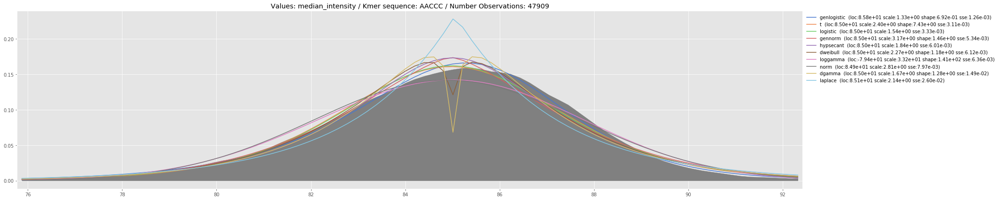

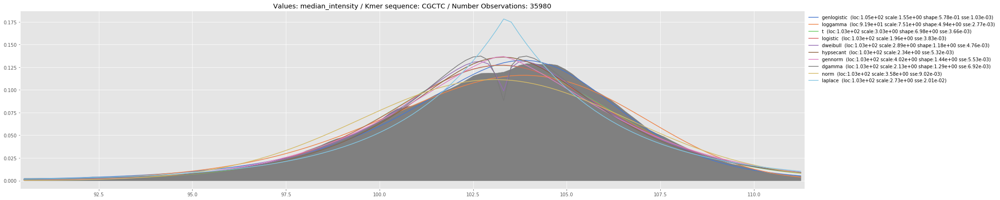

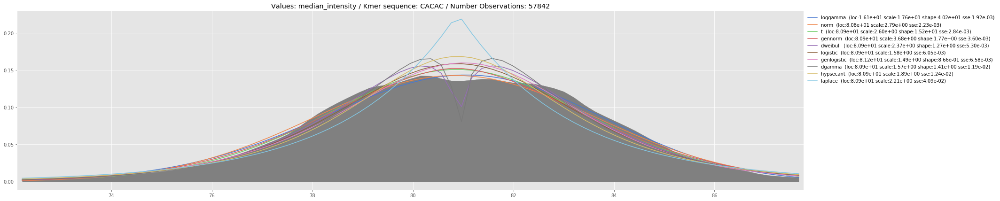

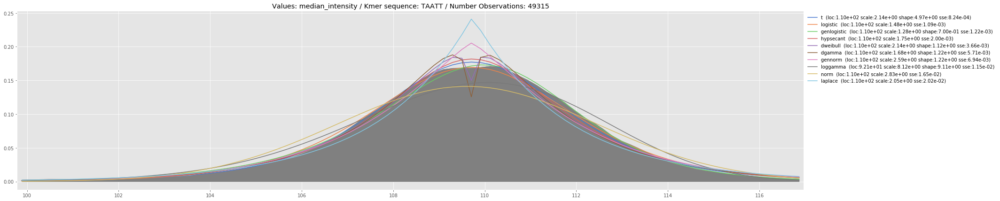

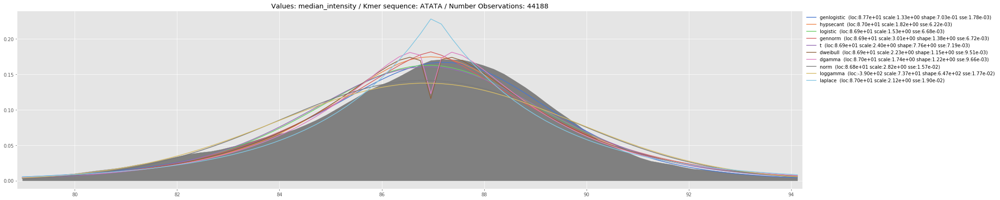

...

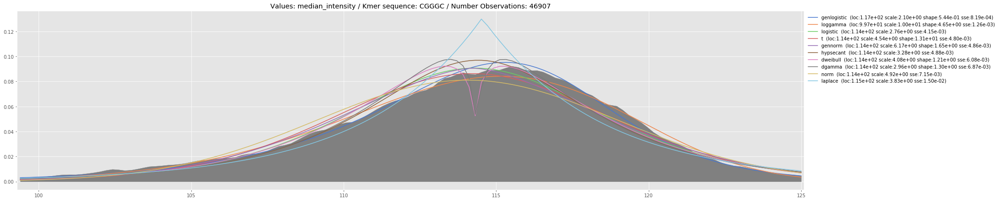

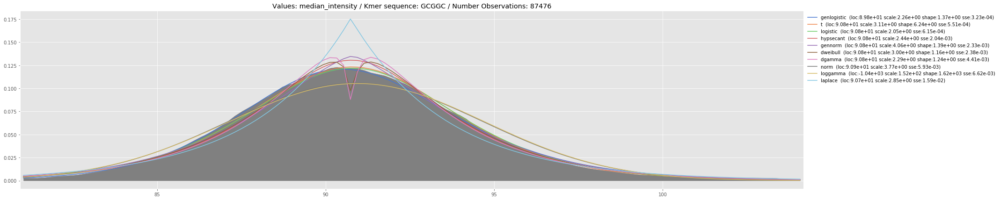

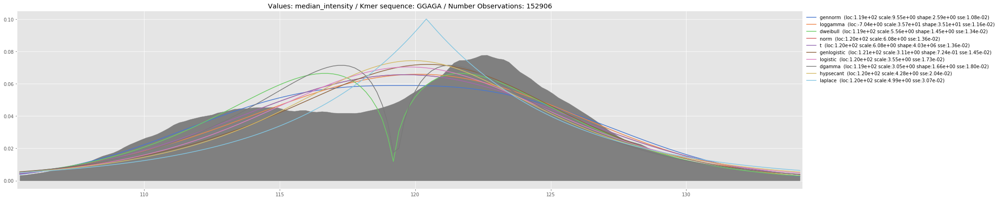

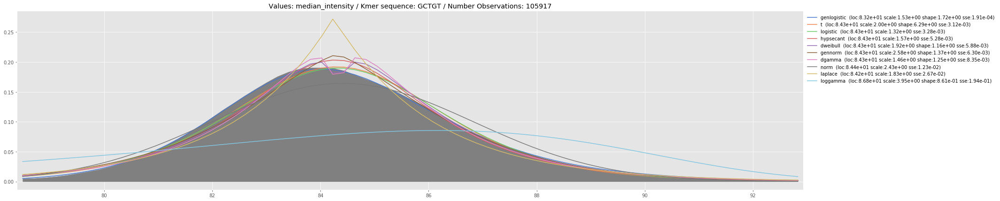

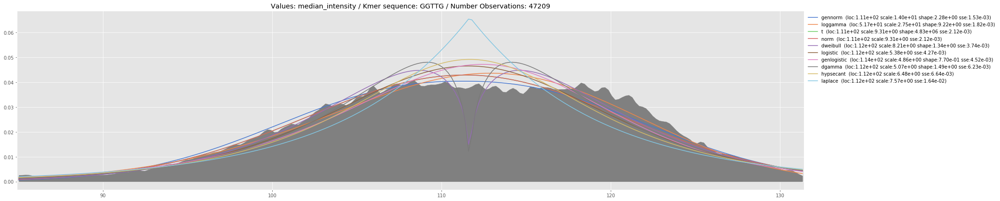

In [47]:
all_kmer_seq = ["".join(i) for i in itertools.product(["A","C","T","G"], repeat=5)]
d_list = ["genlogistic", "t", "logistic", "gennorm", "hypsecant", "dweibull", "dgamma", "norm", "loggamma", "laplace"]
for kmer_seq in tqdm(np.random.choice(all_kmer_seq, 50)):
    df = fit_kmer(db_fn="./Model_building/kmers_dict.db", kmer_seq=kmer_seq, field="median_intensity", sample=None, distribution_list=d_list, plot=True)

Select best 0-bounded candidate distributions

100%|██████████| 20/20 [05:10<00:00, 15.53s/it]


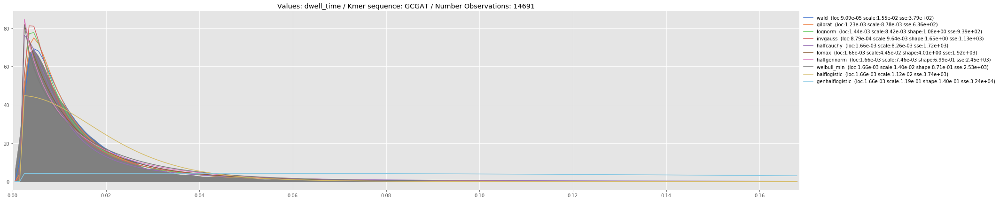

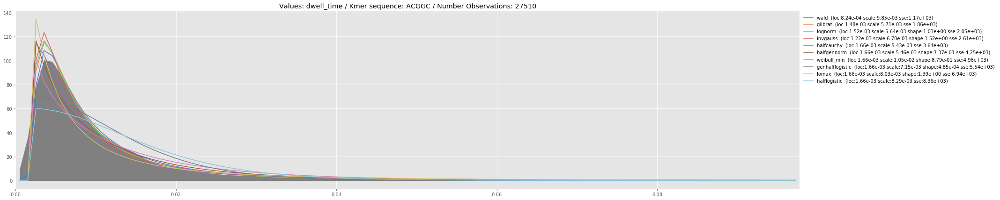

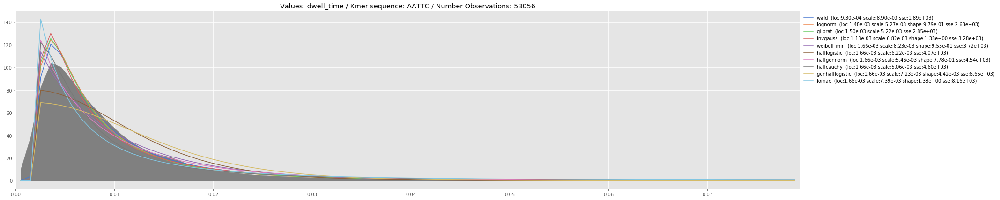

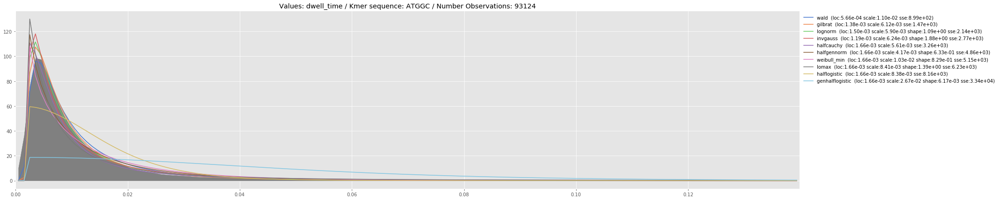

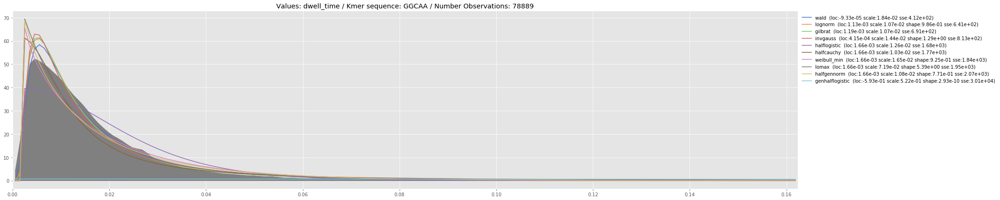

...

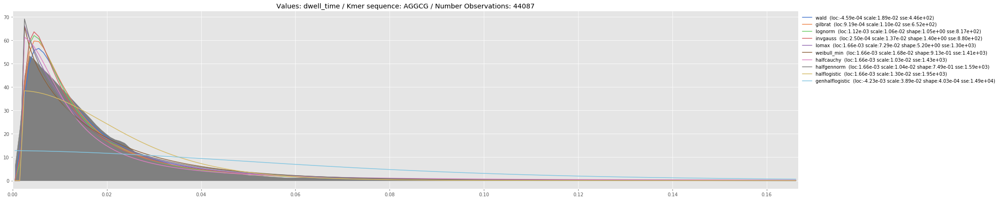

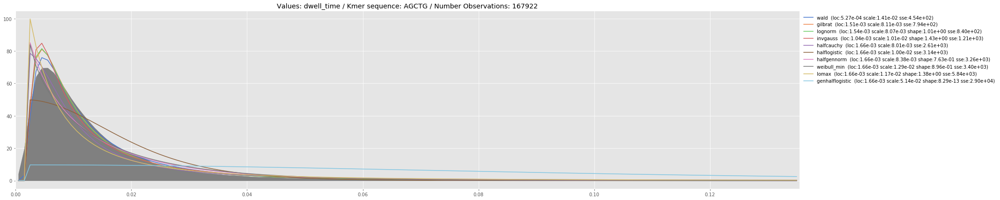

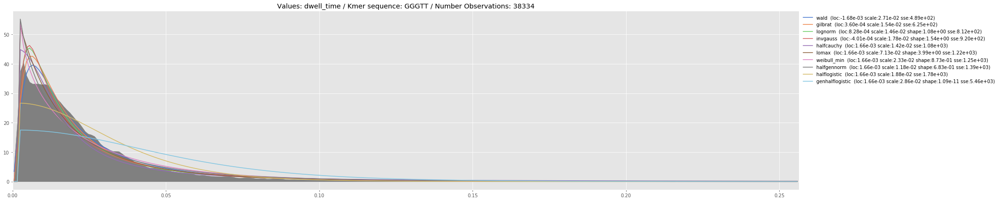

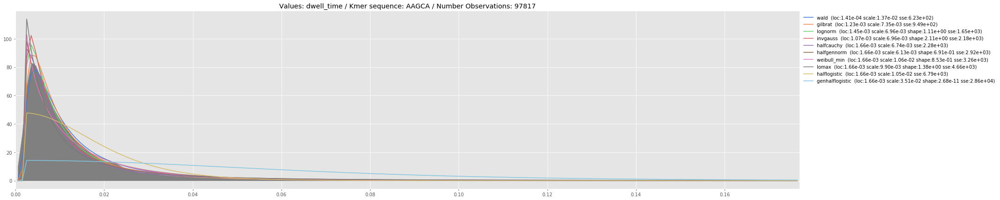

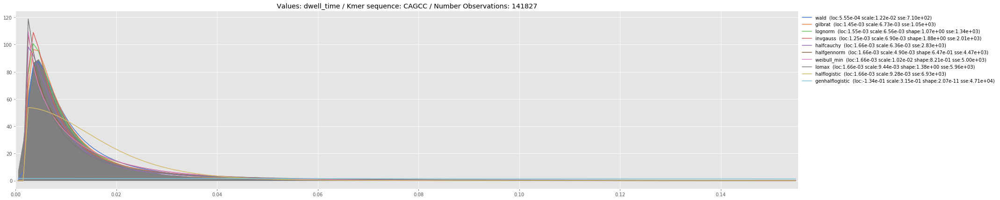

In [5]:
all_kmer_seq = ["".join(i) for i in itertools.product(["A","C","T","G"], repeat=5)]
d_list = ["wald", "halflogistic", "gilbrat", "lognorm", "weibull_min", "invgauss", "halfcauchy", "halfgennorm", "lomax", "genhalflogistic"]
for kmer_seq in tqdm(np.random.choice(all_kmer_seq, 20)):
    df= fit_kmer(db_fn="./Model_building/kmers_dict.db", kmer_seq=kmer_seq, field="dwell_time", sample=None, distribution_list=d_list, plot=True)

## Test modification of distribution mode and std 

Having too many parameters makes it harder to modify the model, to mimick the presence of mods for example. I choose to stick with 2 parameters (loc, scale distribution) even though they are less good at approximating skewed of bimodal distributions.

For median intensity, I will select the logistic regression and for the dwell time the wald distribution(invgauss with mu=1)

/nfs/software/enright/virtualenvs/Python3.6/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


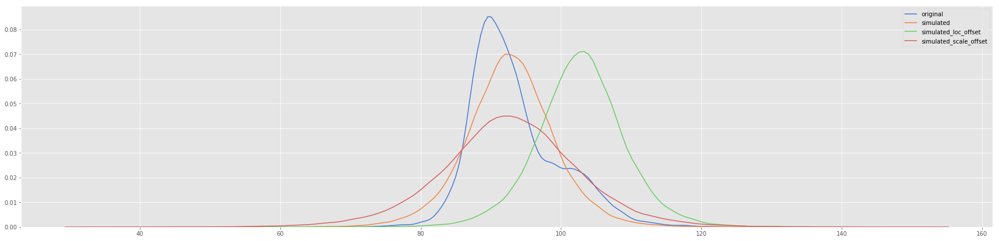

In [35]:
np.random.seed(1000)
n=50000

with shelve.open ("./Model_building/kmers_dict.db", flag='r') as db:
    data = db["CGTGA"]["median_intensity"]
    data = np.random.choice(data, size=n, replace=True)
    
loc, scale = sp.stats.logistic.fit(data)
s_data = sp.stats.logistic.rvs(loc,scale, size=n)
s_data1 = sp.stats.logistic.rvs(loc+10,scale, size=n)
s_data2 = sp.stats.logistic.rvs(loc,scale+2, size=n)

with pl.style.context ("ggplot"), sns.color_palette("muted"):
    fig, ax = pl.subplots (figsize=(30,7))
    _ = sns.kdeplot(data,label="original")
    _ = sns.kdeplot(s_data,label="simulated")
    _ = sns.kdeplot(s_data1,label="simulated_loc_offset")
    _ = sns.kdeplot(s_data2,label="simulated_scale_offset")

/nfs/software/enright/virtualenvs/Python3.6/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


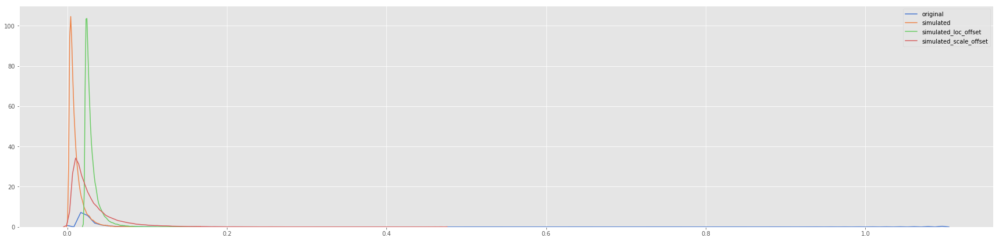

In [36]:
np.random.seed(1000)
n=50000

with shelve.open ("./Model_building/kmers_dict.db", flag='r') as db:
    data = db["CGTGA"]["dwell_time"]
    data = np.random.choice(data, size=n, replace=True)

loc, scale = sp.stats.wald.fit(data)
s_data = sp.stats.wald.rvs(loc,scale, size=n)
s_data1 = sp.stats.wald.rvs(loc+0.02,scale, size=n)
s_data2 = sp.stats.wald.rvs(loc,scale+0.02, size=n)

with pl.style.context ("ggplot"), sns.color_palette("muted"):
    fig, ax = pl.subplots (figsize=(30,7))
    _ = sns.kdeplot(data,label="original")
    _ = sns.kdeplot(s_data,label="simulated")
    _ = sns.kdeplot(s_data1,label="simulated_loc_offset")
    _ = sns.kdeplot(s_data2,label="simulated_scale_offset")

## Generate model file

In [6]:
kmer_dict_fn = "./Model_building/kmers_dict.db"
out_model_fn = "./Model_building/kmers_model_RNA_r9.4_180mv.tsv"

kmer_res = OrderedDict()
all_kmer_seq = ["".join(i) for i in itertools.product(["A","C","T","G"], repeat=5)]
with shelve.open (kmer_dict_fn, flag='r') as db:
    for kmer_seq in tqdm(all_kmer_seq):
        kmer_res[kmer_seq] = OrderedDict()

        # Median intensity fit
        distribution = sp.stats.logistic
        data = db[kmer_seq]["median_intensity"]
        kmer_res[kmer_seq]["raw_intensity_median"] = np.median(data)
        kmer_res[kmer_seq]["raw_intensity_mean"] = np.mean(data)
        loc, scale = distribution.fit(data)
        kmer_res[kmer_seq]["model_intensity_loc"] = loc
        kmer_res[kmer_seq]["model_intensity_scale"] = scale
        kmer_res[kmer_seq]["model_intensity_median"] = distribution.median(loc=loc,scale=scale)
        kmer_res[kmer_seq]["model_intensity_mean"] = distribution.mean(loc=loc,scale=scale)
        kmer_res[kmer_seq]["model_intensity_var"] = distribution.var(loc=loc,scale=scale)
        kmer_res[kmer_seq]["model_intensity_std"] = distribution.std(loc=loc,scale=scale)
        # Compute sum of square errors of prediction
        min, max = np.percentile(data, [0.5, 99.5])
        n_bins = int((max-min)*5)
        bins = np.linspace(min, max, n_bins)
        x = (bins + np.roll(bins, -1))[:-1] / 2.0
        y = np.histogram (data, bins=bins, density=True)[0]
        y = gaussian_filter1d (y, sigma=1)
        pdf_y = distribution.pdf(x, loc=loc, scale=scale)
        kmer_res[kmer_seq]["model_intensity_sse"] = np.sum(np.power(y - pdf_y, 2.0))
        
        # Dwell time fit
        distribution = sp.stats.wald
        data = db[kmer_seq]["dwell_time"]
        kmer_res[kmer_seq]["raw_dwell_median"] = np.median(data)
        kmer_res[kmer_seq]["raw_dwell_mean"] = np.mean(data)
        loc, scale = distribution.fit(data)
        kmer_res[kmer_seq]["model_dwell_loc"] = loc
        kmer_res[kmer_seq]["model_dwell_scale"] = scale
        kmer_res[kmer_seq]["model_dwell_median"] = distribution.median(loc=loc,scale=scale)
        kmer_res[kmer_seq]["model_dwell_mean"] = distribution.mean(loc=loc,scale=scale)
        kmer_res[kmer_seq]["model_dwell_var"] = distribution.var(loc=loc,scale=scale)
        kmer_res[kmer_seq]["model_dwell_std"] = distribution.std(loc=loc,scale=scale)
        # Compute sum of square errors of prediction
        min, max = (0, np.percentile(data, [99.5])[0])
        n_bins = int(max*1000)
        bins = np.linspace(min, max, n_bins)
        x = (bins + np.roll(bins, -1))[:-1] / 2.0
        y = np.histogram (data, bins=bins, density=True)[0]
        y = gaussian_filter1d (y, sigma=1)
        pdf_y = distribution.pdf(x, loc=loc, scale=scale)
        kmer_res[kmer_seq]["model_dwell_sse"] = np.sum(np.power(y-pdf_y, 2.0))
        
# Write file header
with open (out_model_fn, "w") as fp:
    fp.write ("## RUN PARAMETERS\n")
    fp.write ("# Pore_model : r9.4\n")
    fp.write ("# Kit : SQK-RNA001\n")
    fp.write ("# Flowcell : FLO-MIN106\n")
    fp.write ("# Speed : 70bps\n")
    fp.write ("# Initial_current_intensity : 180mv\n")
    fp.write ("# Kmer_size : 5\n")
    fp.write ("## DATA SOURCE AND PROCESSING\n")
    fp.write ("# Data_Source : https://s3.amazonaws.com/nanopore-human-wgs/rna/IVT/01_29_18_R94_12878IVT_{pass/fail}.fastq\n")
    fp.write ("# Reference_Source : ftp://ftp.ebi.ac.uk/pub/databases/gencode/Gencode_human/release_28/gencode.v28.transcripts.fa.gz\n")
    fp.write ("# Minimap_version : Minimap2_2.14\n")
    fp.write ("# Minimap_command : minimap2 -ax map-ont -L reference.fa reads.fastq | samtools view -bh -F 2324 -q 30 | samtools sort -O bam > reads.bam\n")
    fp.write ("# Nanopolish_version : Nanopolish_0.10.1\n")
    fp.write ("# Nanopolish_command : nanopolish eventalign --reads reads.fastq --bam reads.bam --genome reference.fa --print-read-names --signal-index --samples --scale-events > eventalign.tsv\n")
    fp.write ("# NanopolishComp_version : NanopolishComp 0.5\n")
    fp.write ("# NanopolishComp_command : NanopolishComp Eventalign_collapse -i eventalign.tsv -o eventalign_collapsed.tsv\n")
    fp.write ("## MODEL INFORMATION\n")
    fp.write ("# Intensity_model_distribution : logistic (https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.logistic.html)\n")
    fp.write ("# Dwell_model_distribution : wald (https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.wald.html)\n")
    fp.write ("## FIELDS DESCRIPTION\n")
    fp.write ("# *_dwell_* : dwell time related values in seconds\n")
    fp.write ("# *_intensity_* : median intensity related values\n")
    fp.write ("# raw_*_median/mean : Observed median/mean values distribution\n")
    fp.write ("# model_*_loc/scale : Model distribution loc and scale parameters to calculate the probability density function\n")
    fp.write ("# model_*_mean/median/var/std : Model distribution mean/median/variance/standard deviation\n")
    fp.write ("# model_*_sse : Sum of squared errors between real data and model\n")

# Write model values
df = pd.DataFrame.from_dict(kmer_res, orient="index")
with open (out_model_fn, "a") as fp:
    df.to_csv(fp, sep="\t")

100%|██████████| 1024/1024 [08:58<00:00,  1.90it/s]


In [13]:
head (out_model_fn,30,max_char_col=200)

## RUN PARAMETERS
# Pore_model : r9.4
# Kit : SQK-RNA001
# Flowcell : FLO-MIN106
# Speed : 70bps
# Initial_current_intensity : 180mv
# Kmer_size : 5
## DATA SOURCE AND PROCESSING
# Data_Source : https://s3.amazonaws.com/nanopore-human-wgs/rna/IVT/01_29_18_R94_12878IVT_{pass/fail}.fastq
# Reference_Source : ftp://ftp.ebi.ac.uk/pub/databases/gencode/Gencode_human/release_28/gencode.v28.transcripts.fa.gz
# Minimap_version : Minimap2_2.14
# Minimap_command : minimap2 -ax map-ont -L reference.fa reads.fastq | samtools view -bh -F 2324 -q 30 | samtools sort -O bam > reads.bam
# Nanopolish_version : Nanopolish_0.10.1
# Nanopolish_command : nanopolish eventalign --reads reads.fastq --bam reads.bam --genome reference.fa --print-read-names --signal-index --samples --scale-events > eventalign.tsv
# NanopolishComp_version : NanopolishComp 0.5
# NanopolishComp_command : NanopolishComp Eventalign_collapse -i eventalign.tsv -o eventalign_collapsed.tsv
## MODEL INFORMATION
# Intensity_model_distributi

In [15]:
df = pd.read_csv(out_model_fn, sep="\t", index_col=0, comment='#')
display(df.head())

,raw_intensity_median,raw_intensity_mean,model_intensity_loc,model_intensity_scale,model_intensity_median,model_intensity_mean,model_intensity_var,model_intensity_std,model_intensity_sse,raw_dwell_median,raw_dwell_mean,model_dwell_loc,model_dwell_scale,model_dwell_median,model_dwell_mean,model_dwell_var,model_dwell_std,model_dwell_sse
AAAAA,108.957001,108.876440,108.916757,1.493065,108.916757,108.916757,7.333917,2.708120,0.006040,0.00764,0.017296,-0.000295,0.013977,0.009151,0.013682,0.000195,0.013977,2403.438955
AAAAC,107.745003,107.728689,107.762112,1.458878,107.762112,107.762112,7.001905,2.646111,0.000796,0.01029,0.020018,-0.000532,0.017433,0.011250,0.016901,0.000304,0.017433,824.536435
AAAAG,103.708496,103.799376,103.800518,1.815441,103.800518,103.800518,10.842829,3.292845,0.003599,0.00764,0.014295,0.000070,0.012182,0.008303,0.012252,0.000148,0.012182,1858.599474
AAAAT,112.757500,112.701987,112.742464,1.348013,112.742464,112.742464,5.978144,2.445024,0.000818,0.00963,0.016296,0.000066,0.014863,0.010111,0.014929,0.000221,0.014863,447.351468
AAACA,99.272724,99.063937,99.157817,2.232406,99.157817,99.157817,16.395511,4.049137,0.001913,0.00730,0.011167,0.000710,0.009888,0.007393,0.010598,0.000098,0.009888,1127.133415


## Explore model file   

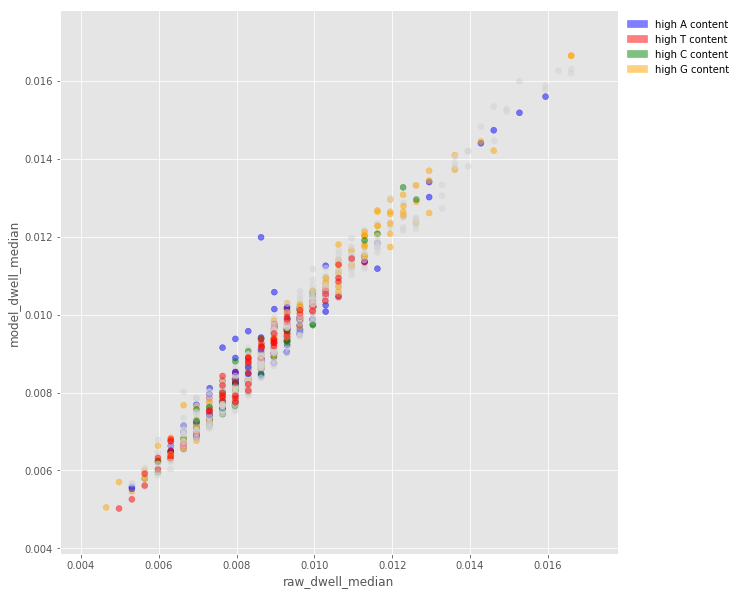

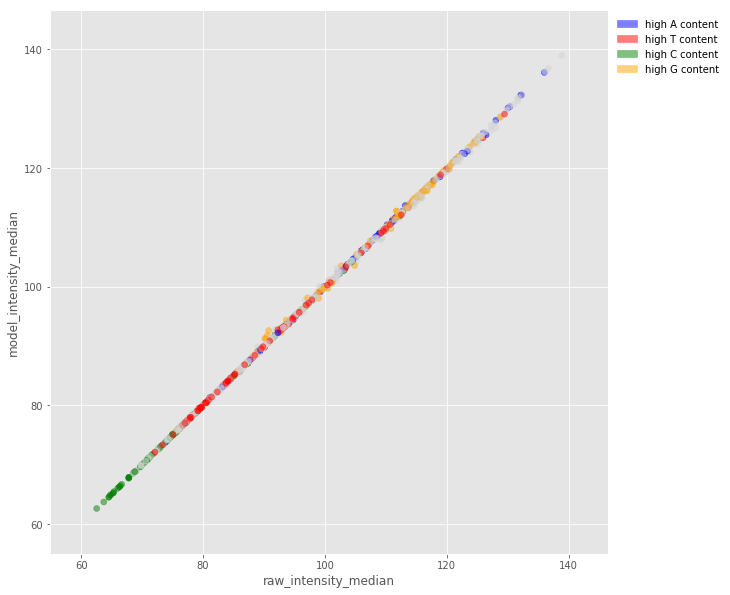

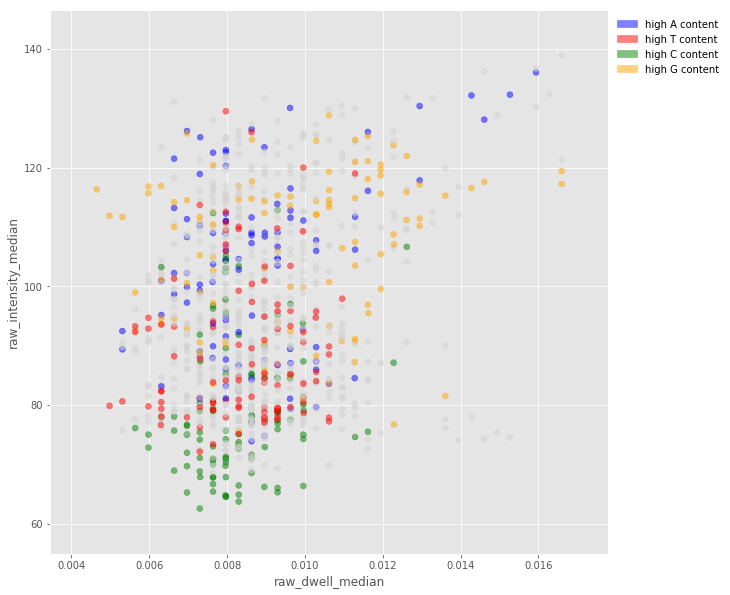

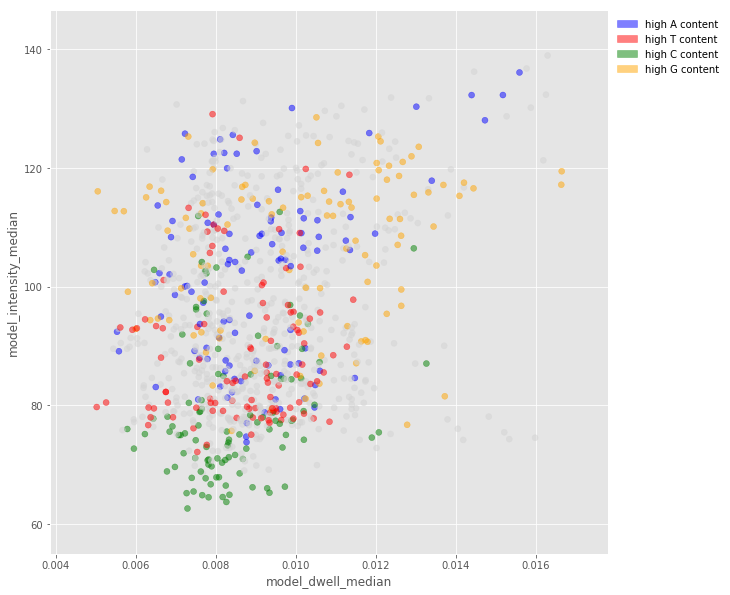

In [41]:
from matplotlib.patches import Patch

def plot_correlation_high_content (df, x, y):
    with pl.style.context ("ggplot"):
        fig, ax = pl.subplots (figsize=(10,10))
        c = []
        for kmer in df.index:
            if kmer.count("A") >= 3:
                c.append("blue")
            elif kmer.count("T") >= 3:
                c.append("red")
            elif kmer.count("C") >= 3:
                c.append("green")
            elif kmer.count("G") >= 3:
                c.append("orange")
            else:
                c.append("lightgrey")

        _ = ax.scatter(x=df[x], y=df[y], color=c, alpha=0.5)
        _ = ax.set_xlabel(x)
        _ = ax.set_ylabel(y)
        xmin, xmax, ymin, ymax = df[x].min(), df[x].max(), df[y].min(), df[y].max()
        _ = ax.set_xlim (xmin-(xmax-xmin)/10, xmax+(xmax-xmin)/10)
        _ = ax.set_ylim (ymin-(ymax-ymin)/10, ymax+(ymax-ymin)/10)
        
        _ = ax.legend(handles=[
            Patch(color='blue', alpha=0.5, label='high A content'),
            Patch(color='red', alpha=0.5, label='high T content'),
            Patch(color='green', alpha=0.5, label='high C content'),
            Patch(color='orange', alpha=0.5, label='high G content')],
            bbox_to_anchor=(1, 1), loc=2, facecolor="white", frameon=False)
        
###########################################################################################

df = pd.read_csv("./Model_building/kmer_model_RNA.tsv", sep="\t", index_col=0, comment='#')
plot_correlation_high_content (df=df ,x="raw_dwell_median", y="model_dwell_median")
plot_correlation_high_content (df=df ,x="raw_intensity_median", y="model_intensity_median")
plot_correlation_high_content (df=df ,x="raw_dwell_median", y="raw_intensity_median")
plot_correlation_high_content (df=df ,x="model_dwell_median", y="model_intensity_median")

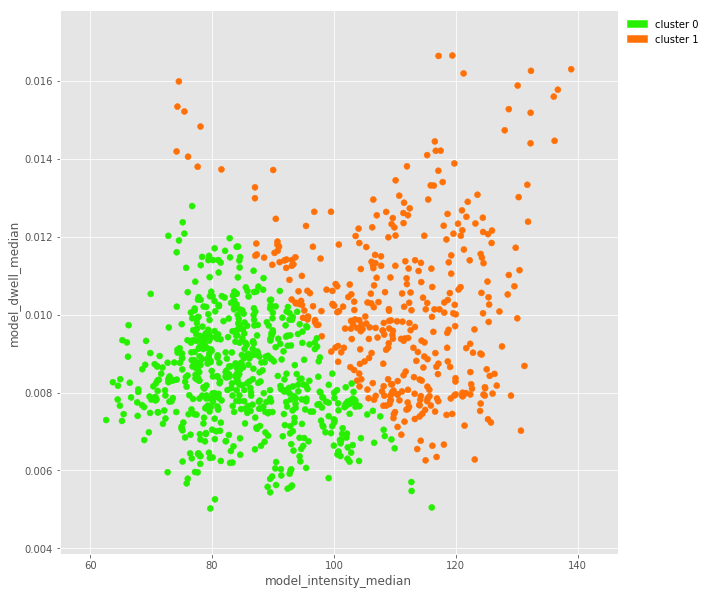

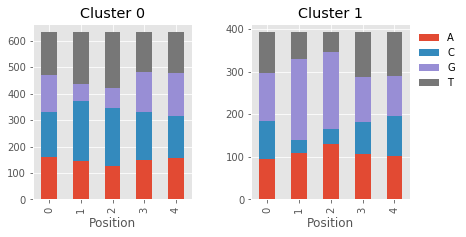

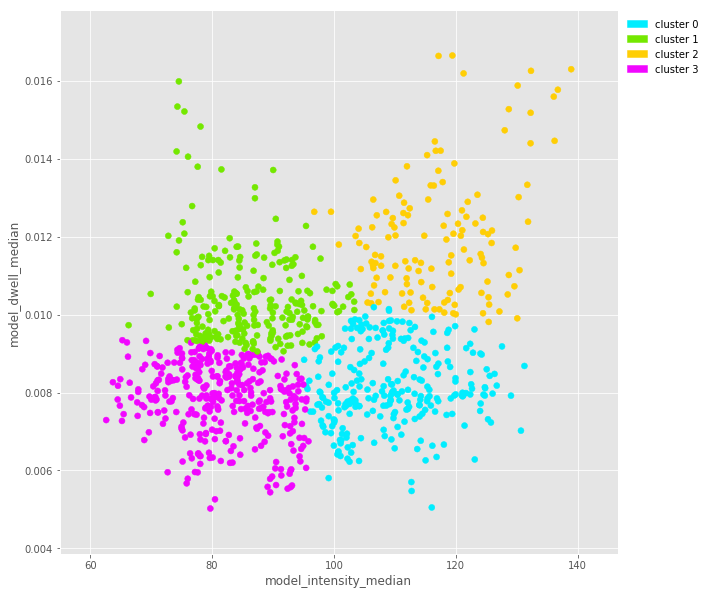

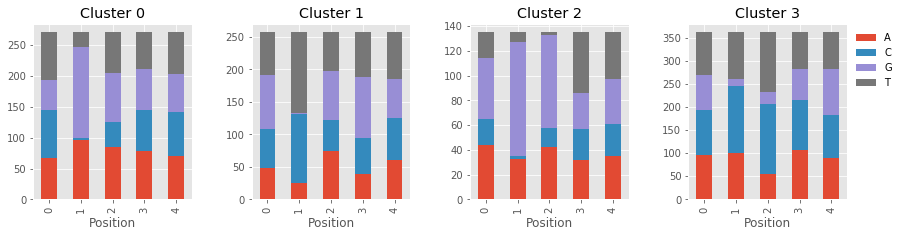

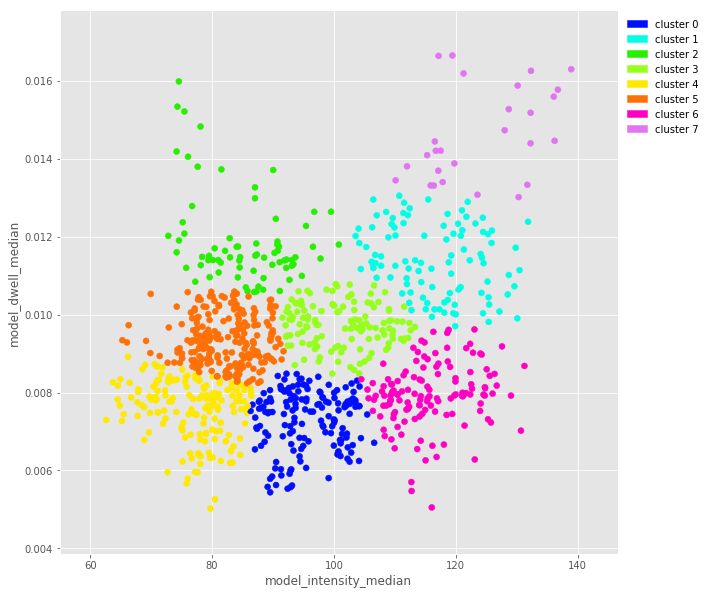

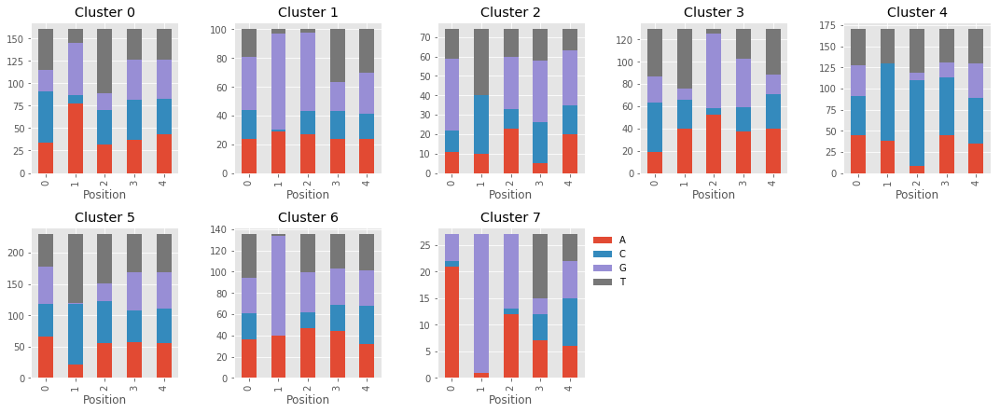

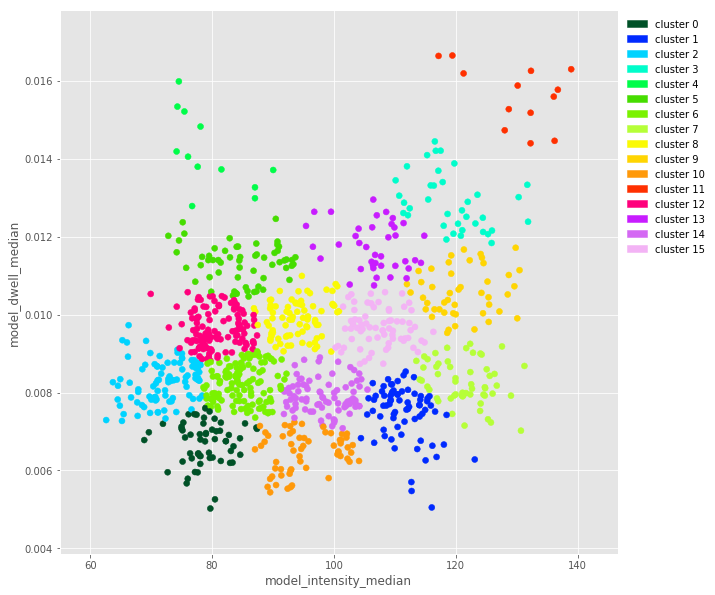

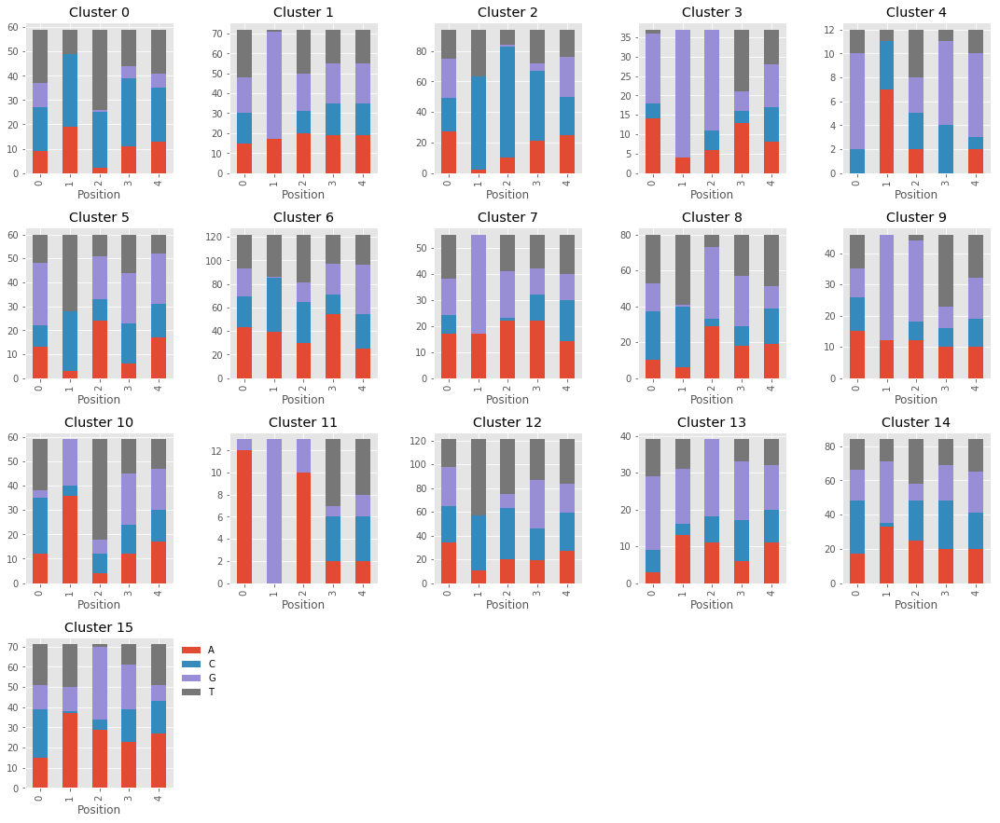

In [43]:
from matplotlib.patches import Patch
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.preprocessing import StandardScaler

def plot_correlation_clusters (df, x, y, n_cluster):
    
    data = df[[x,y]].values
    data = StandardScaler().fit_transform(data)
    cluster = KMeans(n_clusters=n_cluster, random_state=42).fit(data)
    #cluster = AgglomerativeClustering(n_clusters=n_cluster, affinity='euclidean', linkage='ward')  
    lab = cluster.fit_predict(data)

    # Correlation plot
    colors = sns.color_palette("gist_ncar", n_cluster)
    lab_col = [colors[l] for l in lab]
    with pl.style.context ("ggplot"):
        fig, ax = pl.subplots (figsize=(10,10))
        _ = ax.scatter(x=df[x], y=df[y], color=lab_col)
        _ = ax.set_xlabel(x)
        _ = ax.set_ylabel(y)
        xmin, xmax, ymin, ymax = df[x].min(), df[x].max(), df[y].min(), df[y].max()
        _ = ax.set_xlim (xmin-(xmax-xmin)/10, xmax+(xmax-xmin)/10)
        _ = ax.set_ylim (ymin-(ymax-ymin)/10, ymax+(ymax-ymin)/10)
        _ = ax.legend(handles=[Patch(color=colors[l], label=f'cluster {l}') for l in range(n_cluster)],bbox_to_anchor=(1, 1), loc=2, facecolor="white", frameon=False)
    
    # Base composition per cluster
    d=OrderedDict()
    for clust in range (n_cluster):
        d[clust] = [Counter(), Counter(), Counter(), Counter(), Counter()]
    for kmer, clust in zip(df.index, lab):
        for i, base in enumerate(kmer):
            d[clust][i][base]+=1
    with pl.style.context ("ggplot"):
        fig = pl.figure(figsize=(15,15))
        axes = []
        col = row = 0 
        for _ in range (n_cluster):
            axes.append(pl.subplot2grid((5,5), (row,col)))
            col+=1
            if col== 5:
                col=0
                row+=1
        for ax, (cluster_lab, pos_dict) in zip (axes, d.items()):
            df2 = pd.DataFrame(pos_dict)
            df2.plot.bar(ax=ax, stacked=True, legend=False, )
            ax.set_title(f"Cluster {cluster_lab}")
            ax.set_xlabel("Position")
        axes[-1].legend(bbox_to_anchor=(1, 1), loc=2, facecolor="white", frameon=False)
        fig.tight_layout()

###########################################################################################

df = pd.read_csv("./Model_building/kmer_model_RNA.tsv", sep="\t", index_col=0, comment='#')
plot_correlation_clusters (df=df ,x="model_intensity_median", y="model_dwell_median", n_cluster=2)
plot_correlation_clusters (df=df ,x="model_intensity_median", y="model_dwell_median", n_cluster=4)
plot_correlation_clusters (df=df ,x="model_intensity_median", y="model_dwell_median", n_cluster=8)
plot_correlation_clusters (df=df ,x="model_intensity_median", y="model_dwell_median", n_cluster=16)